##  Baseline for Recipe's Steps Recognition from Manually Selected Video Frames with CLIP

### Exploring Tasty Dataset

In [1]:
import json
from os import listdir
from os.path import isfile, join
from IPython.display import display, Video
import matplotlib.image as mpimg
import ipyplot
import torch
import clip
from PIL import Image

/Users/rlopez/opt/anaconda3/envs/clip/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
dataset_root_path = '/Users/rlopez/PTG/experiments/Tasty_Videos_Dataset/'

def load_annotations():
    annotations_path = join(dataset_root_path, 'recipes_processed.json')
    with open(annotations_path) as fin:
        return json.load(fin)

def show_recipe(recipe):
    print('INGREDIENTS:')
    print(', '.join(recipe['ingredients']).capitalize())
    print('STEPS:')
    for index, step in enumerate(recipe['steps'], 1):
        print('%02d. %s' % (index, step.capitalize()))

def show_video(recipe):
    video_path = join(dataset_root_path, 'ALL_RECIPES_without_videos/%s/recipe_video.mp4' % recipe['title'])
    display(Video(video_path, embed=True))

def select_frames_path(recipe, step_id):
    range_frames = recipe['annotations'][step_id - 1]
    if len(range_frames) == 0:
        print('No frames for step %d' % step_id)
        return None
    
    all_frames_path = join(dataset_root_path, 'ALL_RECIPES_without_videos/%s/frames/' % recipe['title'])
    all_frames_files = sorted([f for f in listdir(all_frames_path) if isfile(join(all_frames_path, f))])
    step_frames_files = all_frames_files[range_frames[0]-1 : range_frames[1]]
    step_frames_path = [join(all_frames_path, f) for f in step_frames_files]
    
    return step_frames_path
    
def show_frames(recipe, step_id):
    print('Frames for step: "%s"' % recipe['steps'][step_id - 1].capitalize())
    step_frames_path = select_frames_path(recipe, step_id)
    if step_frames_path:
        images = []
        for img_path in step_frames_path:
            images.append(mpimg.imread(img_path))

        ipyplot.plot_images(images, img_width=150)

def recognize_step(frame, steps):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model, preprocess = clip.load("ViT-B/32", device=device)

    image = preprocess(Image.open(frame)).unsqueeze(0).to(device)
    text = clip.tokenize(steps).to(device)

    with torch.no_grad():
        image_features = model.encode_image(image)
        text_features = model.encode_text(text)

        logits_per_image, logits_per_text = model(image, text)
        probs = logits_per_image.softmax(dim=-1).cpu().numpy()

    probs_sorted = sorted([(i, p) for i, p in enumerate(probs[0])], key=lambda x:x[1], reverse=True)
    #print("Label probs:", probs_sorted)
    recognized_step_id = probs_sorted[0][0]
    recognized_step_text = steps[recognized_step_id].capitalize()
    print('The frame represents the step %d: "%s"' % (recognized_step_id +1, recognized_step_text))
    
def simulate_video_summarization(recipe, step_id, frame_id):
    step_frames_path = select_frames_path(recipe, step_id)
    
    if step_frames_path:
        return step_frames_path[frame_id]

In [3]:
dataset_annotations = load_annotations()

In [4]:
recipe = dataset_annotations['apple-pie-cheesecake']#'apple-pie-cheesecake']#'carrot-orange-ginger-juice']

In [ ]:
show_video(recipe)

In [6]:
show_recipe(recipe)

INGREDIENTS:
Pie crusts, cream cheese, sugar, sour cream, vanilla extract, ground cinnamon, ground nutmeg, eggs, medium apples, water, sugar, ground cinnamon, ground nutmeg, cornstarch
STEPS:
01. Preheat oven to 300˚f (150˚c).
02. Line a springform pan with a pie crust, pressing it around the sides of the pan until smooth.
03. In a medium bowl, beat the cream cheese, sugar, vanilla, cinnamon, and nutmeg until smooth.
04. Add the sour cream and mix together.
05. Add in one egg at a time, whisking until smooth.
06. Pour mixture into the springform pan and bake for 1 hour and 15 minutes.
07. After baking, turn off the oven and let the cheesecake cool inside for 1 hour without opening the oven door.
08. Turn up the oven temperature to 425˚f (220˚c).
09. In a saucepan, add the apples, sugar, cinnamon, nutmeg, cornstarch, and water over medium-low heat.
10. Stir occasionally until apples are soft (about 10 minutes), then remove from heat.
11. Let cool.
12. Once cool, spread apple pie filling

Frames for step: "Add in one egg at a time, whisking until smooth."



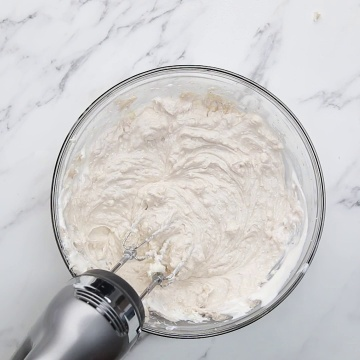
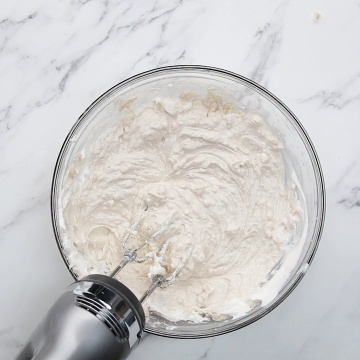
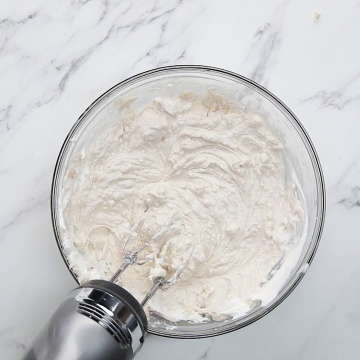
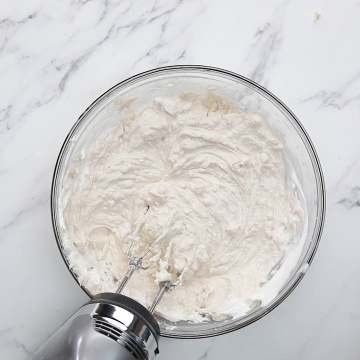
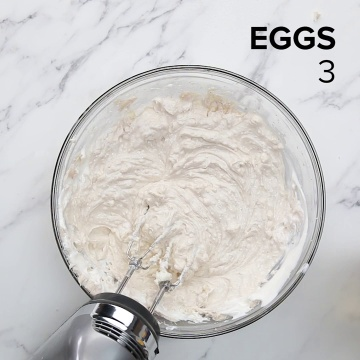
...
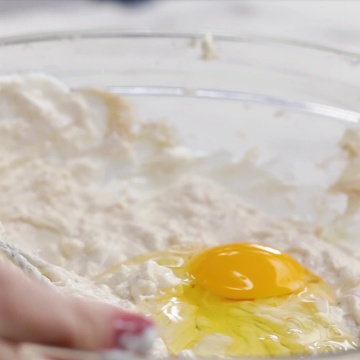
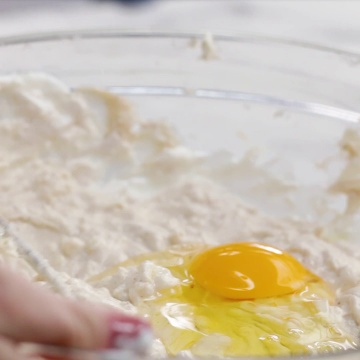
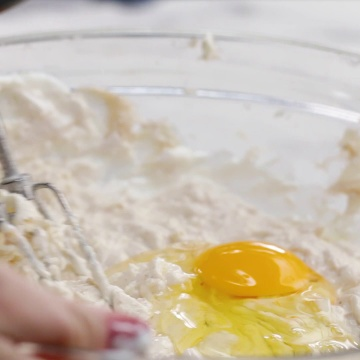
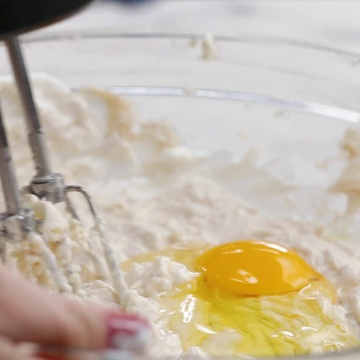
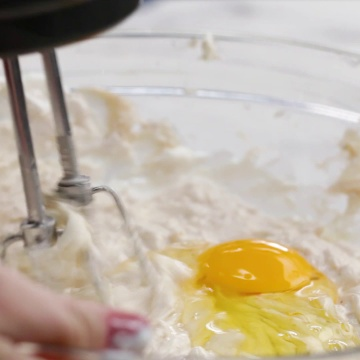

In [7]:
step_id = 5
show_frames(recipe, step_id)

### Identifying Recipe Steps

#### Selecting the correct frame:

In [22]:
frame_id = 28
representative_frame = simulate_video_summarization(recipe, step_id, frame_id)

In [23]:
recognize_step(representative_frame, recipe['steps'])

The frame represents the step 5: "Add in one egg at a time, whisking until smooth."


#### Selecting the incorrect frame:

In [24]:
frame_id = 2
representative_frame = simulate_video_summarization(recipe, step_id, frame_id)

In [25]:
recognize_step(representative_frame, recipe['steps'])

The frame represents the step 3: "In a medium bowl, beat the cream cheese, sugar, vanilla, cinnamon, and nutmeg until smooth."
